In [1]:
import json
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from src.aggregator import create_plot_group_topvecs

pd.set_option('display.max_colwidth', -1)

C:\Users\risto\AppData\Local\Temp\ipykernel_2340\1363467151.py:11: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


## Data

In [2]:
df=pd.read_csv('data/interim/stenos_cleaned_topics.csv')
df.shape

(209949, 22)

In [3]:
df=df[~pd.isnull(df.speaker)]
df.shape

(209938, 22)

In [4]:
df_topic_clusters=pd.read_excel('data/interim/riigikogu_topics_clusters.xlsx')
df_topic_clusters.shape

(1152, 8)

## Colors for plots

In [5]:
colors=json.loads(Path('utils/colors.json').read_text())
colors=list(colors.keys())[10:]

## Non-informative clusters and topics

In [6]:
#detected by plotting data and visually inspectig topic names
clusters_noninform=[0,1, 4, 5, 9, 10,14,15,16]
topics_noninform=[1, 2, 3, 22, 96, 122, 844, 589, 1059, 140, 408,
                 420, 539, 423, 314, 1079, 568, 190, 987, 21, 287]

In [7]:
#save for future use
pd.DataFrame(clusters_noninform).to_csv('data/interim/noninform_clusters.csv', index=False)
pd.DataFrame(topics_noninform).to_csv('data/interim/noninform_topics.csv', index=False)

In [8]:
df_inform=df[(~df.topic_cluster.isin(clusters_noninform))&(~df.topic_id.isin(topics_noninform))]
df_inform.shape

(96770, 22)

## Save informative data

In [9]:
df_inform.to_csv('data/interim/stenos_cleaned_topics_inform.csv', index=False)

## Informative vs noninformative segments dynamics

In [10]:
df_seg_count=pd.DataFrame(df_inform.groupby('year')['link_steno'].count())
df_seg_count.columns=['inform']
df_seg_count['noninform']=df.groupby('year')['link_steno'].count()

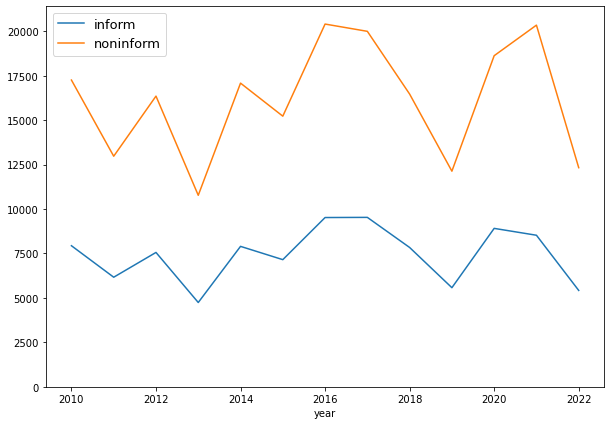

In [11]:
fig, ax =plt.subplots(figsize=(10,7))
plt.rcParams.update({'font.size': 13})
ax=df_seg_count.plot(ax=ax)
ax.set_ylim([0, df_seg_count['noninform'].max()+1000])
plt.savefig('visualisations/png/inform_noniform_segments_count_dynamics.png')

## Topic cluster dynamics

In [12]:
def plot_topic_time_dynamics(df, cluster_id=None, cluster_col='topic_cluster', time_col='year', topic_col='topic_words3',
                             figsize=(15,10), colors=colors, bbox_to_anchor=(1.09, 1.00), legend_fontsize=12,
                             x_tick_fontsize=12, y_tick_fontsize=12, x_axis_fontsize=12,
                             normalize_timesteps=False,
                             use_percentage=True):
    """function to plot topics time dynamics 
    -INPUT:
        -df: pd.DataFrame containing data, eahc row is some speaker text at some time
        -cluster_id: if not None then int with topic cluster id used for plotting
        -cluster_col: str: name of the data cluster column
        -time_col: str of the data time column
        -topic_col: str of the data topic column
        -figsize: tuple of plot size
        -color: list of colornames/codes used for plotting
        -bbox_to_anchor: tuple of legend position
        -legend_fontsize: int of legend font size
        -x_tick_fontsize: int of x-axis tick labels font size
        -y_tick_fontsize: int of y-axis tick labels font size
        -x_axis_fontsize: int of x-axis title font size
        -normalize_timesteps: bool, if True normalizes data in each timestep (takes % of topics),
            useful for stacked are chart
        -use_percentage: bool, if not True counts each timestamp different topics and plots the scale of counts,
            otherwise plots the scale as %
    -OUTPUT:
        -plot of df topics (of cluster topics) dynamics"""
    fig, ax = plt.subplots(figsize=figsize)

    if not normalize_timesteps:
        df_topic_prop = df.groupby([time_col])[topic_col].\
            value_counts(normalize = use_percentage).\
            unstack()
        #keep only cluster topics for plotting
        if cluster_id is not None:
            df=df[df[cluster_col]==cluster_id]
        topic_cluster_names=df[topic_col].unique()
        columns2keep = topic_cluster_names
        df_topic_prop = df_topic_prop[columns2keep]
        df_topic_prop = df_topic_prop.reindex(sorted(df_topic_prop.columns), axis=1)
        ax = df_topic_prop.plot.area(ax=ax, color=colors)
    
    if normalize_timesteps:
        if cluster_id is not None:
            df=df[df[cluster_col]==cluster_id]
        df_plot=df.groupby([time_col])[topic_col].\
            value_counts(normalize = use_percentage).\
            unstack()
        df_plot = df_plot.reindex(sorted(df_plot.columns), axis=1)
        df_plot.plot.area(ax=ax, color=colors)
    
    ax.tick_params(axis='x', labelsize=x_tick_fontsize)
    ax.tick_params(axis='y', labelsize=y_tick_fontsize)
    ax.xaxis.get_label().set_fontsize(x_axis_fontsize)
    ax.legend(bbox_to_anchor=bbox_to_anchor, fontsize=legend_fontsize)

Topic cluster segment counts

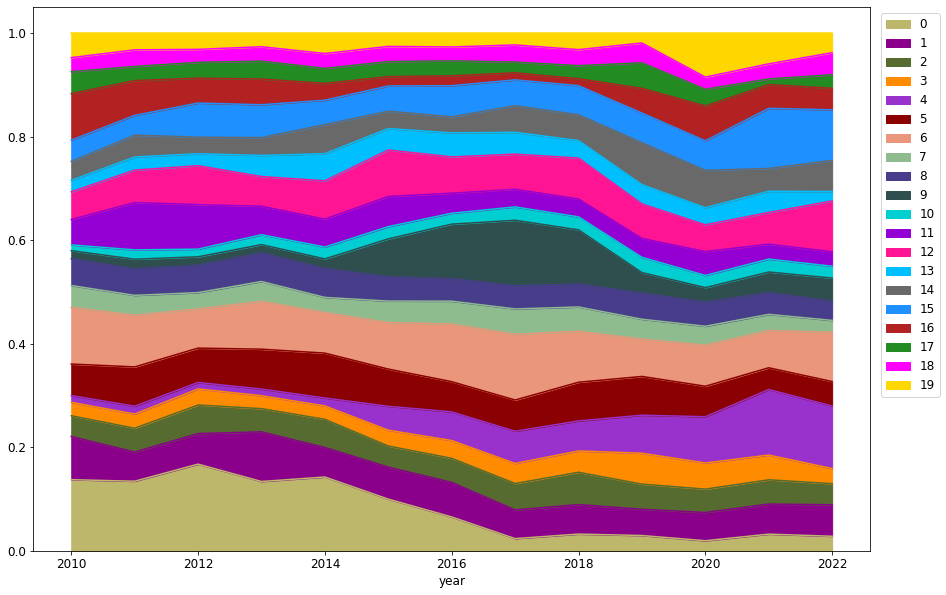

In [13]:
#topic cluster counts
plot_topic_time_dynamics(df,topic_col='topic_cluster', use_percentage=True, normalize_timesteps=True)

Topic cluster porportions

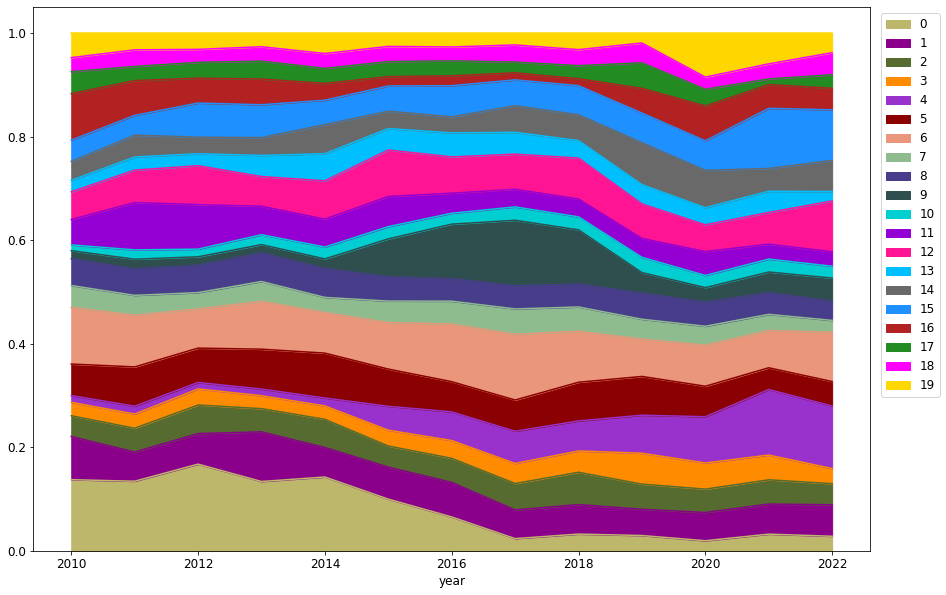

In [14]:
#topic cluster proportions
plot_topic_time_dynamics(df,topic_col='topic_cluster')

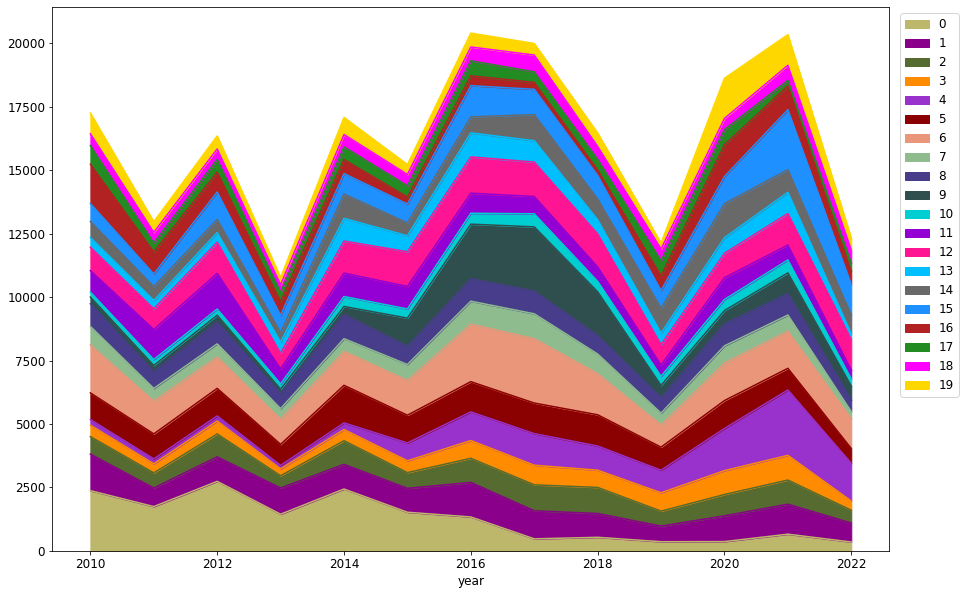

In [15]:
#topic cluster proportions
plot_topic_time_dynamics(df,topic_col='topic_cluster',  use_percentage=False)

Informative topic cluster counts

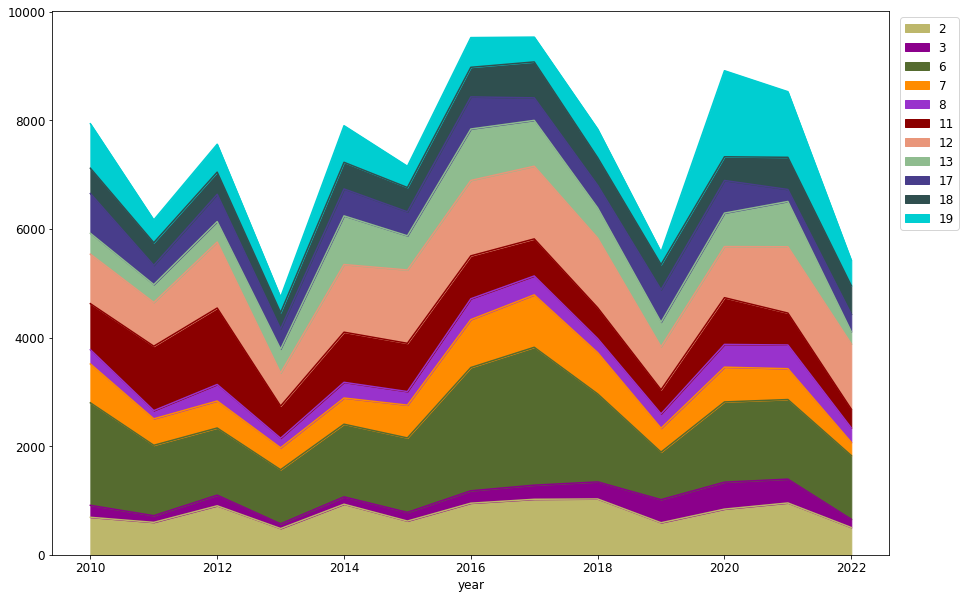

In [16]:
#keeping only informative clusters, topics
plot_topic_time_dynamics(df_inform,topic_col='topic_cluster', use_percentage=False)

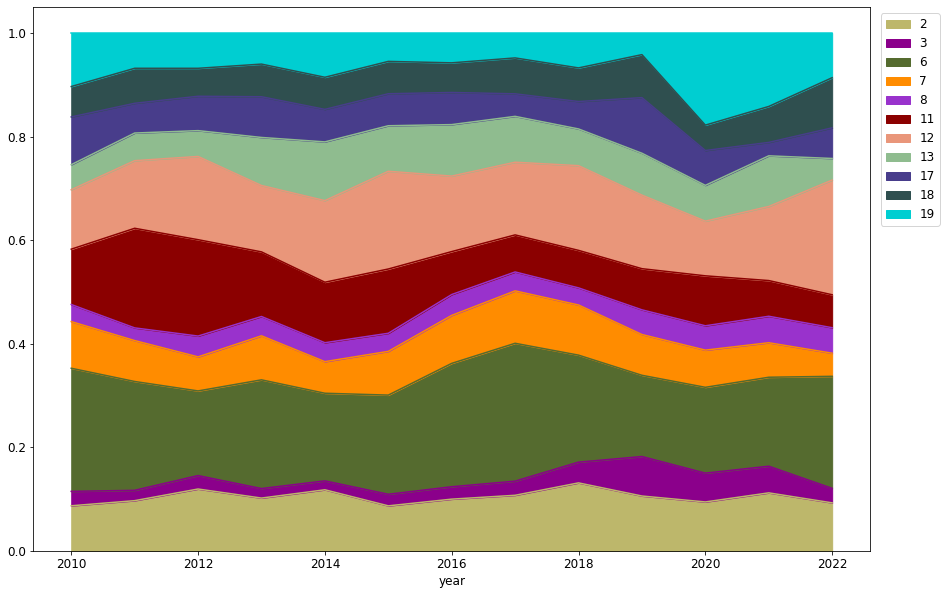

In [17]:
#Informative topic cluster proportions
plot_topic_time_dynamics(df_inform, topic_col='topic_cluster', use_percentage=True)

## Some cluster topics dynamics

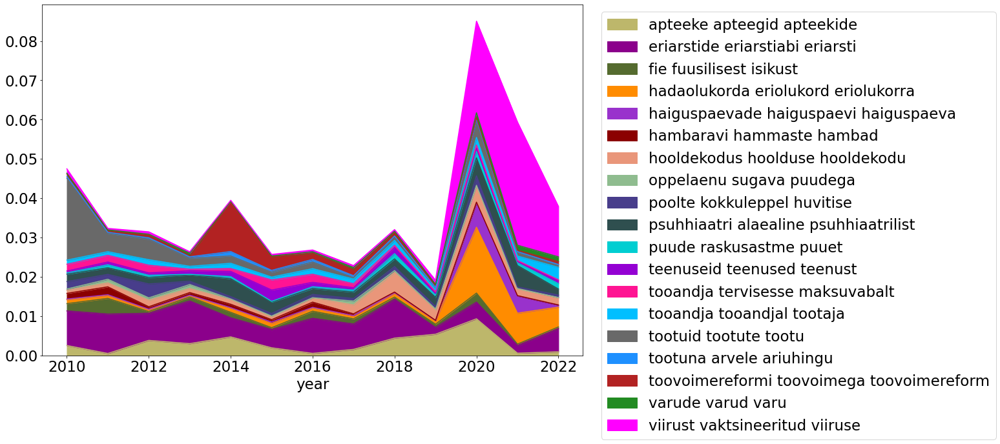

In [18]:
cluster_id=19
FONT_SIZE=23
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

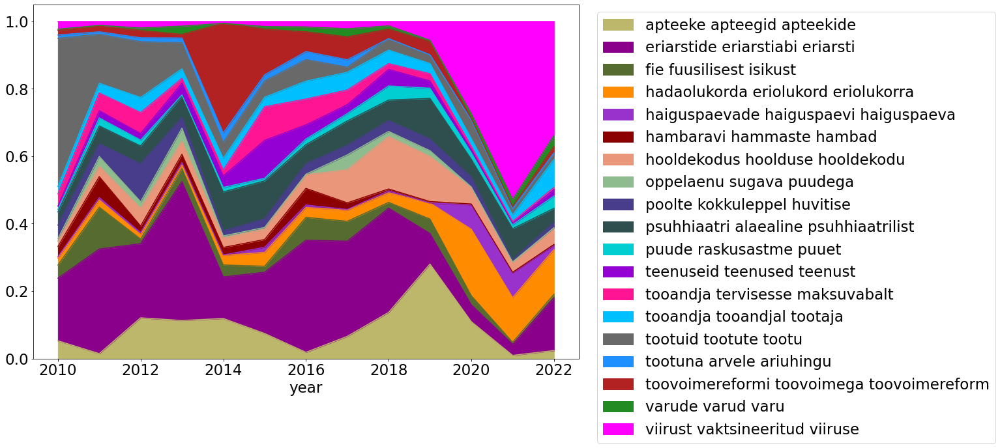

In [19]:
cluster_id=19
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True,legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

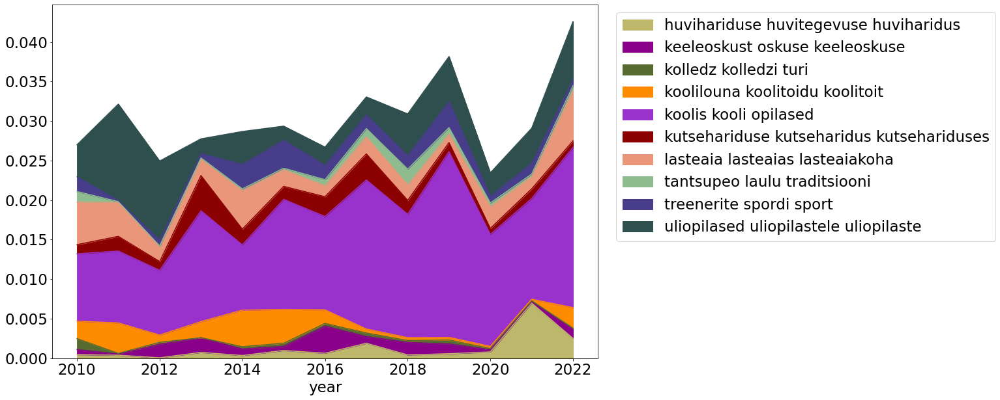

In [20]:
cluster_id=18
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

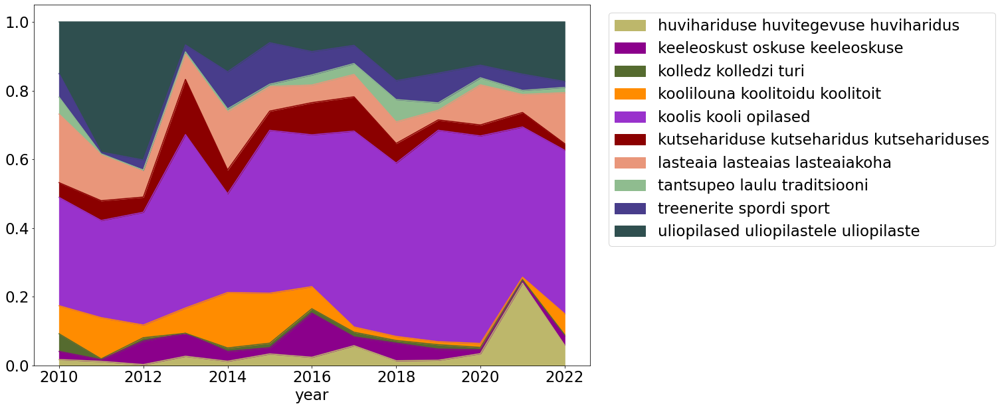

In [21]:
cluster_id=18
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

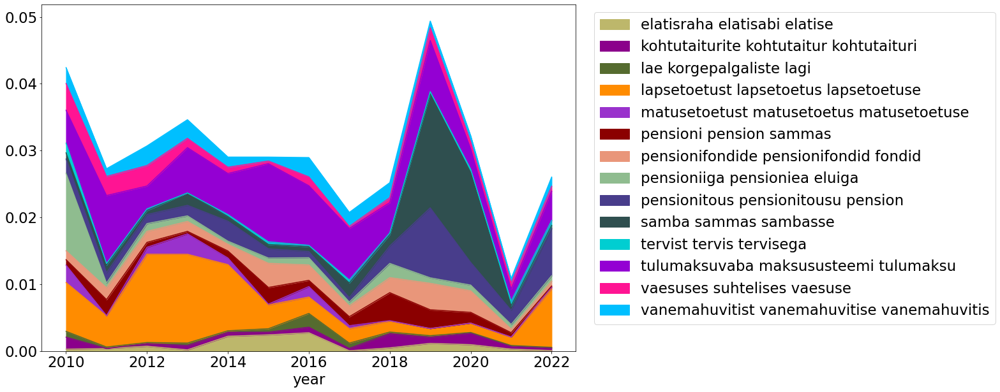

In [22]:
cluster_id=17
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

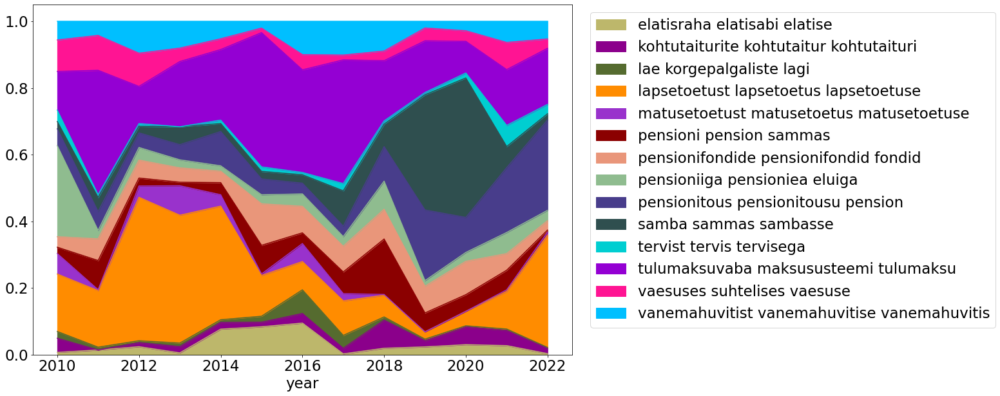

In [23]:
cluster_id=17
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

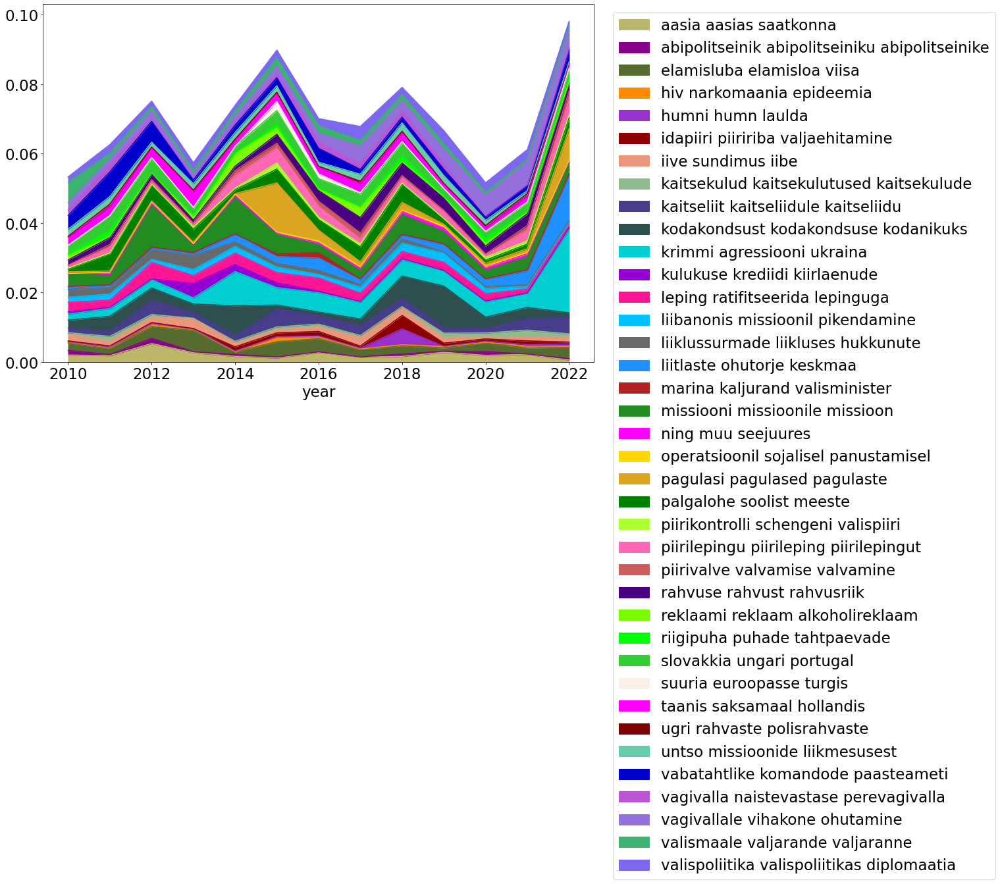

In [24]:
cluster_id=12
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

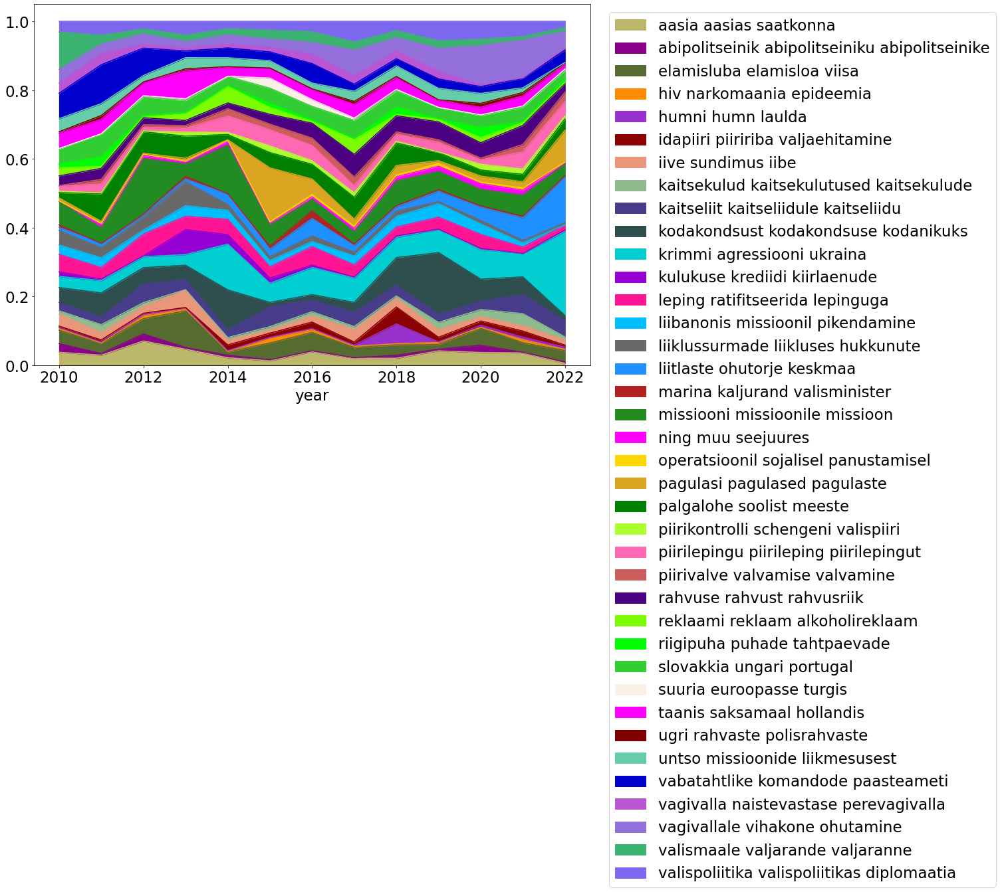

In [25]:
cluster_id=12
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

In [31]:
df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:10].index.tolist()

['krimmi agressiooni ukraina',
 'missiooni missioonile missioon',
 'kodakondsust kodakondsuse kodanikuks',
 'vagivallale vihakone ohutamine',
 'palgalohe soolist meeste',
 'slovakkia ungari portugal',
 'vabatahtlike komandode paasteameti',
 'elamisluba elamisloa viisa',
 'kaitseliit kaitseliidule kaitseliidu',
 'leping ratifitseerida lepinguga']

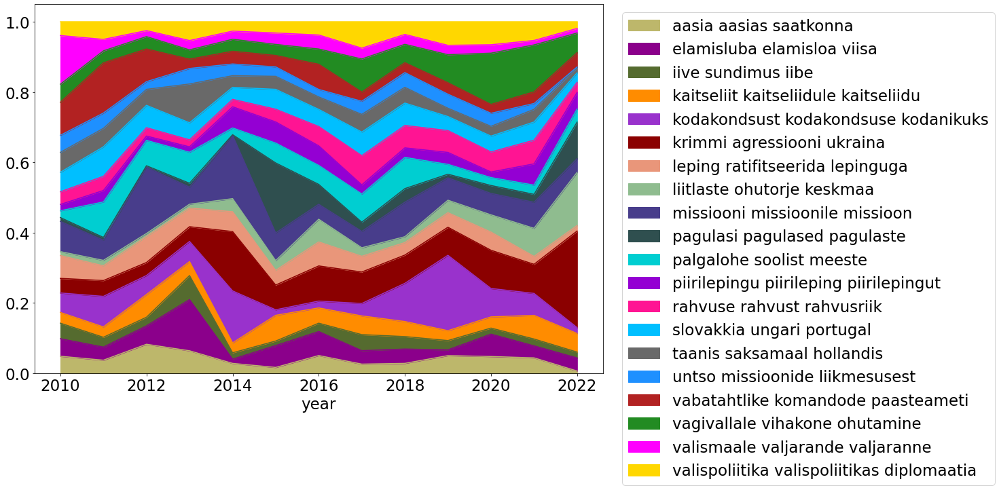

In [33]:
cluster_id=12
n_sub_topics=20
clust12_topics_sub=df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:n_sub_topics].index.tolist()
df_sub_12=df[(df.topic_cluster==cluster_id)&(df.topic_words3.isin(clust12_topics_sub))]
plot_topic_time_dynamics(df_sub_12, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

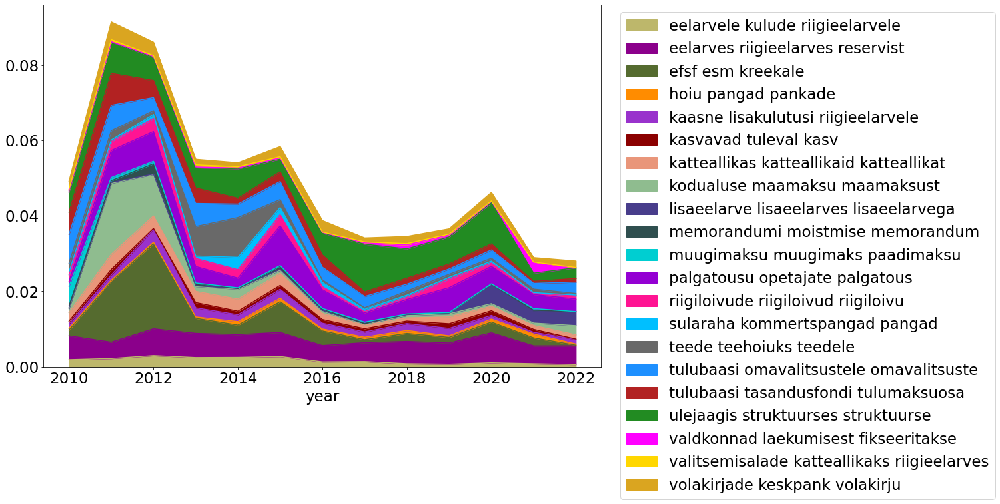

In [31]:
cluster_id=11
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

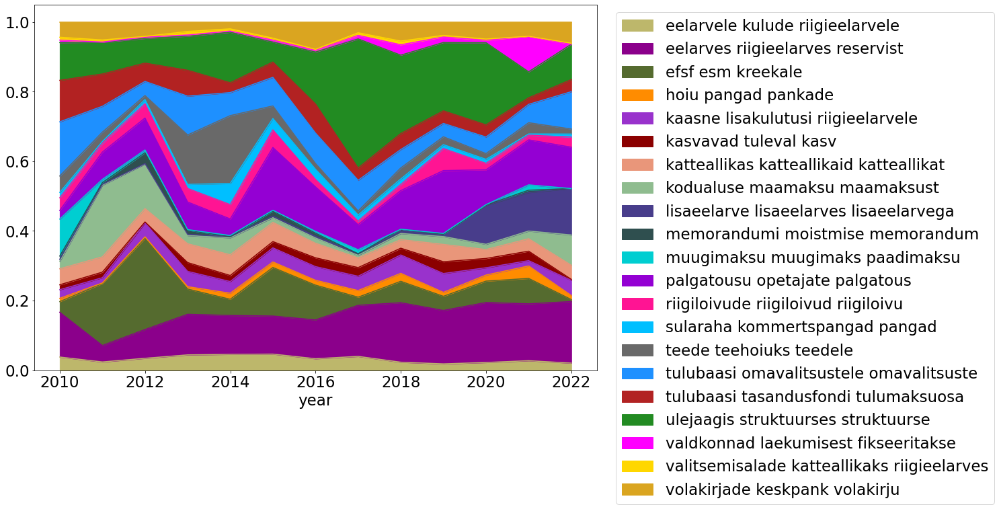

In [32]:
cluster_id=11
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

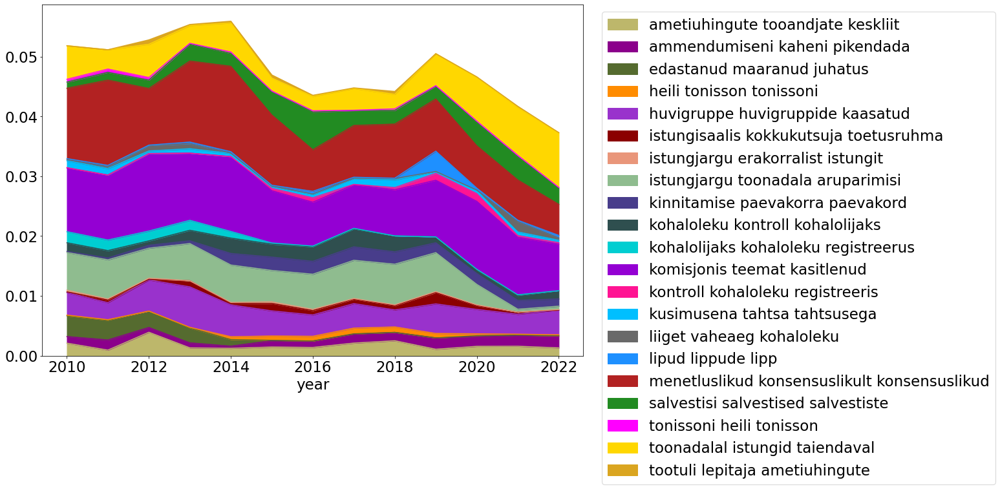

In [33]:
cluster_id=8
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

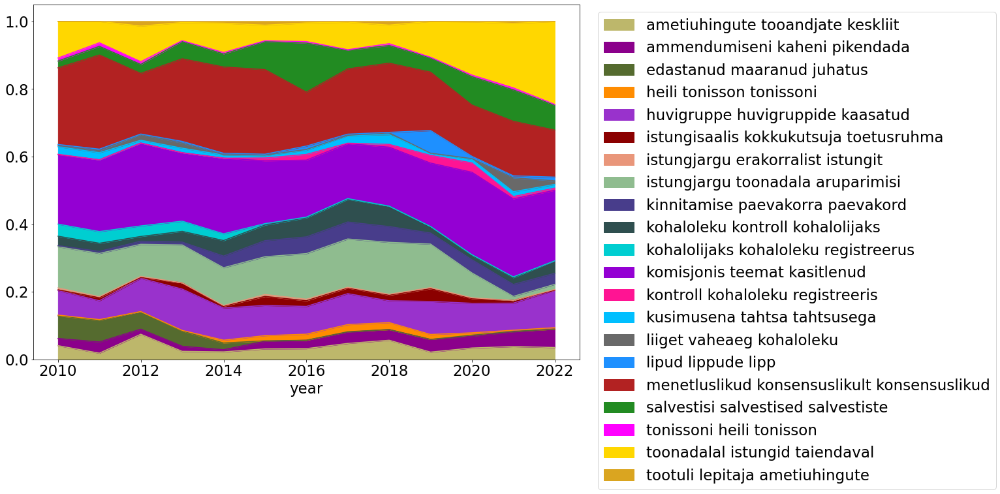

In [34]:
cluster_id=8
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

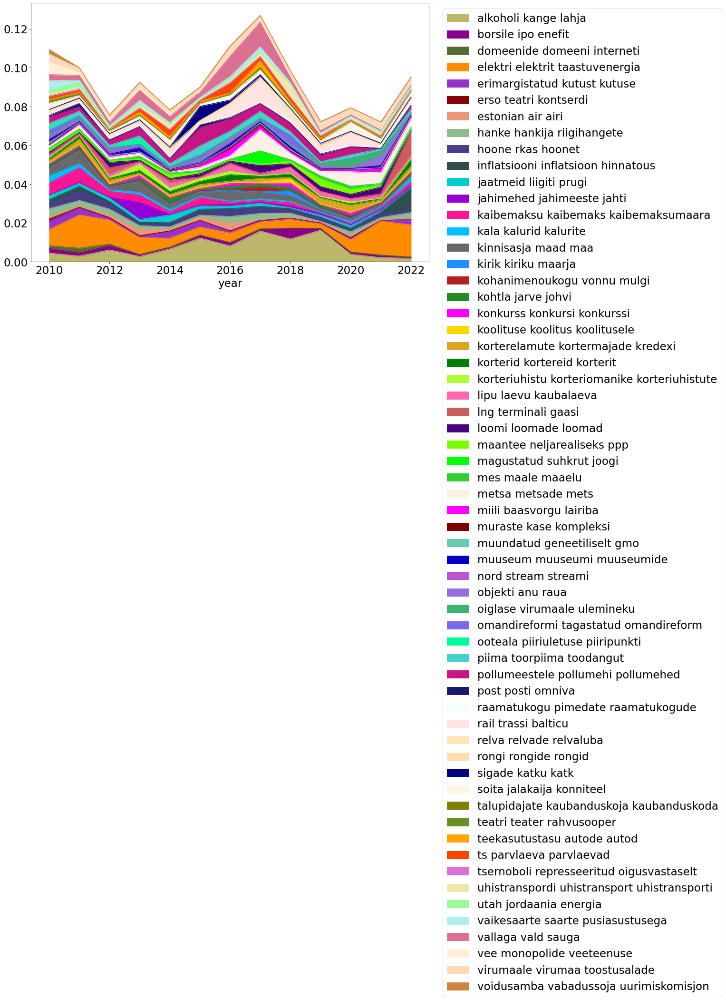

In [35]:
cluster_id=6
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

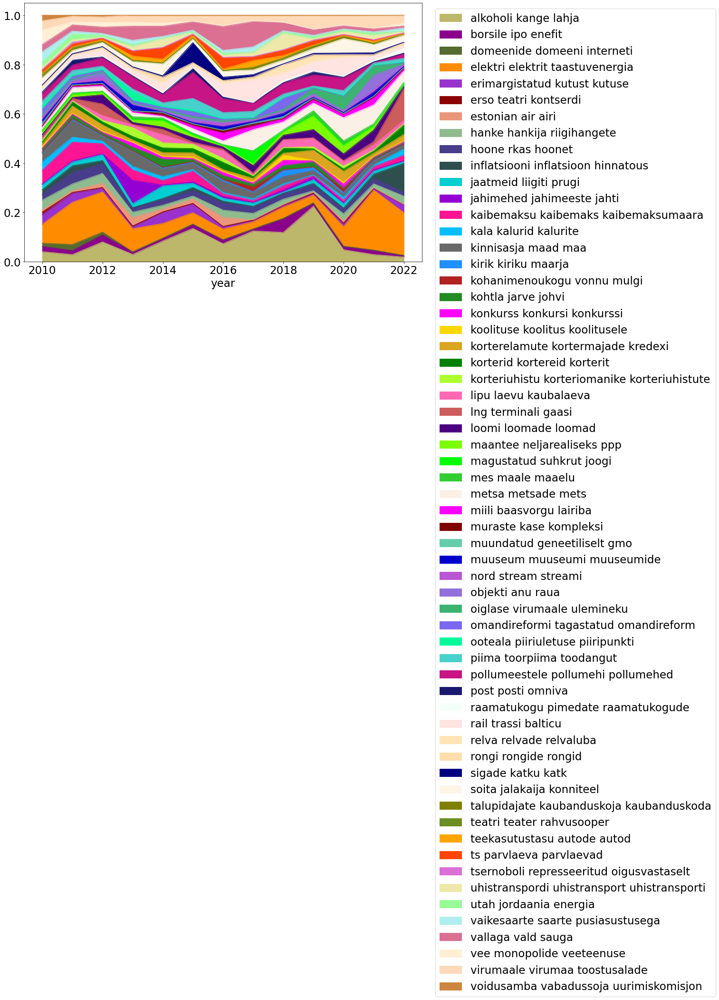

In [36]:
cluster_id=6
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

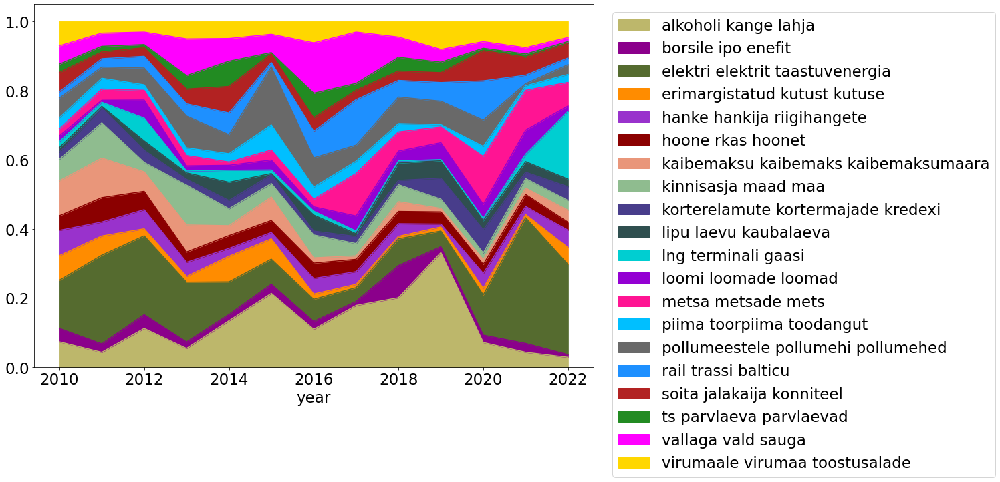

In [34]:
cluster_id=6
n_sub_topics=20
clust6_topics_sub=df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:n_sub_topics].index.tolist()
df_sub_6=df[(df.topic_cluster==cluster_id)&(df.topic_words3.isin(clust6_topics_sub))]
plot_topic_time_dynamics(df_sub_6, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

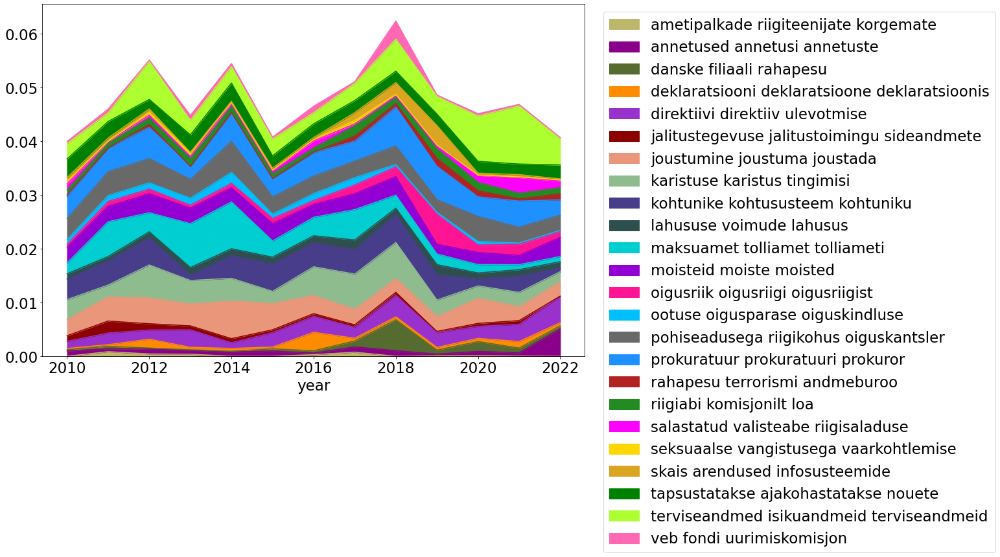

In [38]:
cluster_id=2
plot_topic_time_dynamics(df, cluster_id, legend_fontsize=FONT_SIZE,
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

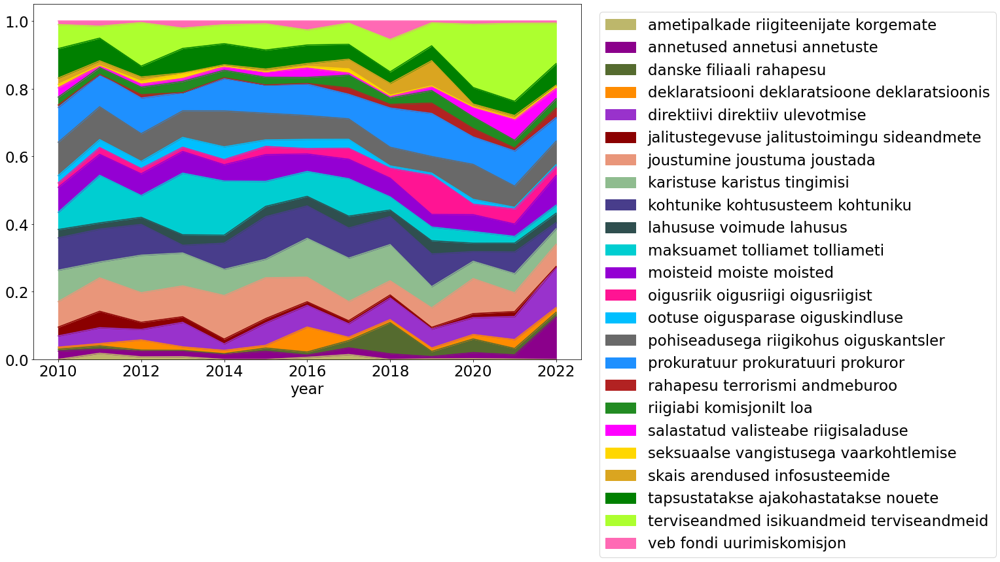

In [39]:
cluster_id=2
plot_topic_time_dynamics(df, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

## Most popular topics

<AxesSubplot:>

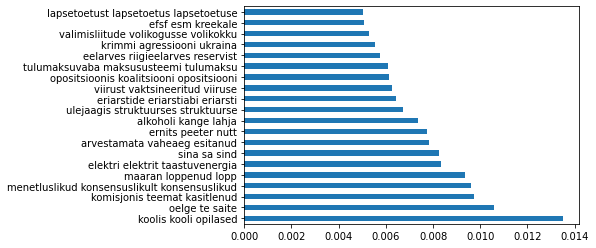

In [31]:
df.topic_words3.value_counts(normalize=True).head(20).plot(kind='barh')

<AxesSubplot:>

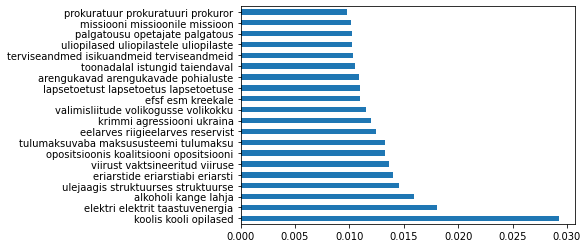

In [32]:
df_inform.topic_words3.value_counts(normalize=True).head(20).plot(kind='barh')

## Get pre-calculated trendy categories in each year

In [80]:
df_yearly_diffs_topic=pd.read_csv('data/interim/trending/yearly_comparisons/yearly_diffs_topic.csv')
df_yearly_diffs_topic_inform=pd.read_csv('data/interim/trending/yearly_comparisons/yearly_diffs_topic_inform.csv')

trendy_categories=Path('data/interim/trending/yearly_comparisons/trendy_categories.txt').\
    read_text().split('\n')
trendy_categories_inform=Path('data/interim/trending/yearly_comparisons/trendy_categories_inform.txt').\
    read_text().split('\n')

In [81]:
df_yearly_diffs_topic.head()

,2010 vs 2011,2011 vs 2012,2012 vs 2013,2013 vs 2014,2014 vs 2015,2015 vs 2016,2016 vs 2017,2017 vs 2018,2018 vs 2019,2019 vs 2020,2020 vs 2021,2021 vs 2022
0,kodualuse maamaksu maamaksust 1.713% -> 10.486% (512.243%),arvestamata vaheaeg esitanud 3.886% -> 8.285% (113.22%),haaletada haaletas haaletusele 6.438% -> 8.449% (31.247%),missiooni missioonile missioon 7.237% -> 6.453% (-10.834%),palgatousu opetajate palgatous 5.663% -> 6.072% (7.228%),vallaga vald sauga 4.777% -> 6.324% (32.384%),kruuse urmas lahkunud 1.141% -> 7.094% (521.783%),danske filiaali rahapesu 2.537% -> 4.279% (68.643%),jarviku jarvik maaeluministri 4.748% -> 10.42% (119.475%),viirust vaktsineeritud viiruse 1.898% -> 12.222% (544.001%),elektri elektrit taastuvenergia 13.583% -> 9.305% (-31.498%),krimmi agressiooni ukraina 5.045% -> 9.933% (96.905%)
1,efsf esm kreekale 2.474% -> 9.067% (266.535%),missiooni missioonile missioon 4.229% -> 6.062% (43.347%),arvestamata vaheaeg esitanud 23.348% -> 16.527% (-29.212%),abielu kooselu samasooliste 1.645% -> 6.921% (320.822%),pollumeestele pollumehi pollumehed 5.92% -> 5.503% (-7.05%),arvestamata vaheaeg esitanud 7.373% -> 7.473% (1.365%),metsa metsade mets 2.215% -> 5.504% (148.499%),borsile ipo enefit 2.307% -> 4.009% (73.791%),samba sammas sambasse 2.77% -> 8.697% (214.041%),hadaolukorda eriolukord eriolukorra 1.606% -> 8.786% (447.144%),moonika helle helme 2.693% -> 4.496% (66.922%),lng terminali gaasi 1.246% -> 5.101% (309.268%)
2,uliopilased uliopilastele uliopilaste 6.66% -> 6.79% (1.945%),vaheaega kumneminutilist haaletust 1.6% -> 4.082% (155.102%),teede teehoiuks teedele 1.373% -> 3.9% (183.948%),krimmi agressiooni ukraina 6.25% -> 6.056% (-3.1%),sigade katku katk 0.901% -> 4.213% (367.59%),rail trassi balticu 1.142% -> 3.334% (191.902%),jurgen ligi ligil 1.007% -> 2.878% (185.887%),omandireformi tagastatud omandireform 1.269% -> 3.378% (166.278%),pensionitous pensionitousu pension 4.253% -> 5.336% (25.461%),vorklaev puustusmaa torm 3.358% -> 4.083% (21.613%),kauguhendus avaksite ettekandjalt 1.874% -> 4.156% (121.815%),inflatsiooni inflatsioon hinnatous 1.365% -> 4.631% (239.262%)
3,palgatousu opetajate palgatous 1.998% -> 3.997% (100.018%),lapsetoetust lapsetoetus lapsetoetuse 6.857% -> 6.579% (-4.051%),jahimehed jahimeeste jahti 0.429% -> 4.41% (927.623%),helir valdor seeder 1.974% -> 5.768% (192.237%),efsf esm kreekale 5.534% -> 4.706% (-14.966%),lugupeetav lugupeetavad eesistuja 2.492% -> 3.507% (40.709%),ulejaagis struktuurses struktuurse 7.919% -> 6.387% (-19.347%),uhistranspordi uhistransport uhistransporti 4.498% -> 4.775% (6.147%),sikkut riina sikkuti 0.989% -> 2.815% (184.609%),metsa metsade mets 3.942% -> 3.886% (-1.405%),huvihariduse huvitegevuse huviharidus 1.756% -> 3.711% (111.305%),kaja kallas kallase 6.944% -> 7.148% (2.938%)
4,elektri elektrit taastuvenergia 13.796% -> 9.54% (-30.85%),terviseandmed isikuandmeid terviseandmeid 2.4% -> 3.533% (47.223%),valimisliitude volikogusse volikokku 1.888% -> 3.668% (94.216%),toovoimereformi toovoimega toovoimereform 0.987% -> 7.895% (700.0%),pagulasi pagulased pagulaste 0.257% -> 8.159% (3069.924%),haale valimispaeval valimiste 1.558% -> 2.874% (84.536%),alkoholi kange lahja 11.074% -> 7.978% (-27.958%),kodakondsust kodakondsuse kodanikuks 4.383% -> 4.685% (6.885%),jevgeni ossinovski toominister 1.286% -> 2.479% (92.789%),rahvahaaletuse rahvahaaletus rahvahaaletusel 2.044% -> 2.957% (44.678%),protseduurilise protseduuriline protseduurilist 7.728% -> 5.567% (-27.964%),liitlaste ohutorje keskmaa 4.866% -> 5.47% (12.398%)


In [82]:
df_yearly_diffs_topic_inform.head()

,2010 vs 2011,2011 vs 2012,2012 vs 2013,2013 vs 2014,2014 vs 2015,2015 vs 2016,2016 vs 2017,2017 vs 2018,2018 vs 2019,2019 vs 2020,2020 vs 2021,2021 vs 2022
0,kodualuse maamaksu maamaksust 0.227% -> 3.958% (1645.02%),missiooni missioonile missioon 0.6% -> 2.633% (338.641%),teede teehoiuks teedele 0.212% -> 1.771% (736.748%),abielu kooselu samasooliste 0.105% -> 2.431% (2205.311%),palgatousu opetajate palgatous 0.557% -> 2.237% (301.615%),vallaga vald sauga 0.643% -> 2.311% (259.264%),metsa metsade mets 0.347% -> 2.288% (559.982%),danske filiaali rahapesu 0.231% -> 1.212% (425.101%),jarviku jarvik maaeluministri 0.612% -> 4.448% (626.286%),viirust vaktsineeritud viiruse 0.233% -> 4.87% (1988.684%),elektri elektrit taastuvenergia 1.302% -> 4.176% (220.791%),krimmi agressiooni ukraina 0.997% -> 5.46% (447.62%)
1,efsf esm kreekale 0.328% -> 3.423% (944.701%),lapsetoetust lapsetoetus lapsetoetuse 0.973% -> 2.858% (193.603%),valimisliitude volikogusse volikokku 0.291% -> 1.666% (472.321%),missiooni missioonile missioon 0.464% -> 2.266% (388.46%),pollumeestele pollumehi pollumehed 0.582% -> 2.027% (248.139%),rail trassi balticu 0.154% -> 1.218% (692.161%),ulejaagis struktuurses struktuurse 1.239% -> 2.655% (114.204%),borsile ipo enefit 0.21% -> 1.136% (441.131%),samba sammas sambasse 0.357% -> 3.713% (939.225%),hadaolukorda eriolukord eriolukorra 0.197% -> 3.501% (1674.55%),kauguhendus avaksite ettekandjalt 0.18% -> 1.865% (938.742%),lng terminali gaasi 0.246% -> 2.804% (1038.233%)
2,uliopilased uliopilastele uliopilaste 0.882% -> 2.563% (190.564%),terviseandmed isikuandmeid terviseandmeid 0.341% -> 1.535% (350.502%),jahimehed jahimeeste jahti 0.066% -> 2.003% (2928.232%),krimmi agressiooni ukraina 0.401% -> 2.127% (430.828%),sigade katku katk 0.089% -> 1.552% (1651.328%),haale valimispaeval valimiste 0.21% -> 1.05% (400.792%),alkoholi kange lahja 1.733% -> 3.316% (91.334%),omandireformi tagastatud omandireform 0.115% -> 0.957% (729.108%),pensionitous pensionitousu pension 0.549% -> 2.278% (315.176%),metsa metsade mets 0.484% -> 1.549% (219.773%),huvihariduse huvitegevuse huviharidus 0.168% -> 1.666% (889.527%),inflatsiooni inflatsioon hinnatous 0.27% -> 2.546% (843.535%)
3,palgatousu opetajate palgatous 0.265% -> 1.509% (470.094%),apteeke apteegid apteekide 0.097% -> 0.82% (742.75%),kinnisasja maad maa 0.318% -> 1.307% (311.733%),toovoimereformi toovoimega toovoimereform 0.063% -> 2.772% (4282.492%),pagulasi pagulased pagulaste 0.025% -> 3.006% (11772.742%),ts parvlaeva parvlaevad 0.042% -> 1.124% (2579.235%),rail trassi balticu 1.218% -> 2.434% (99.811%),uhistranspordi uhistransport uhistransporti 0.409% -> 1.353% (230.509%),koolis kooli opilased 3.279% -> 5.112% (55.887%),rahvahaaletuse rahvahaaletus rahvahaaletusel 0.251% -> 1.178% (369.232%),viirust vaktsineeritud viiruse 4.87% -> 7.484% (53.66%),pagulasi pagulased pagulaste 0.27% -> 2.066% (665.768%)
4,elektri elektrit taastuvenergia 1.827% -> 3.602% (97.092%),karistuse karistus tingimisi 0.454% -> 1.323% (191.273%),noukogudesse ariuhingute noukogudes 0.357% -> 1.244% (248.276%),valimisea valimisiga valimisoiguse 0.127% -> 1.418% (1020.637%),efsf esm kreekale 0.544% -> 1.734% (218.49%),abielu kooselu samasooliste 0.531% -> 1.397% (162.916%),magustatud suhkrut joogi 0.021% -> 1.354% (6343.909%),kodakondsust kodakondsuse kodanikuks 0.399% -> 1.327% (232.807%),kodakondsust kodakondsuse kodanikuks 1.327% -> 2.601% (95.989%),annetus erjk annetuse 0.287% -> 1.223% (326.219%),opositsiooni koalitsioonil opositsioonil 0.281% -> 1.384% (393.37%),liitlaste ohutorje keskmaa 0.962% -> 3.007% (212.594%)


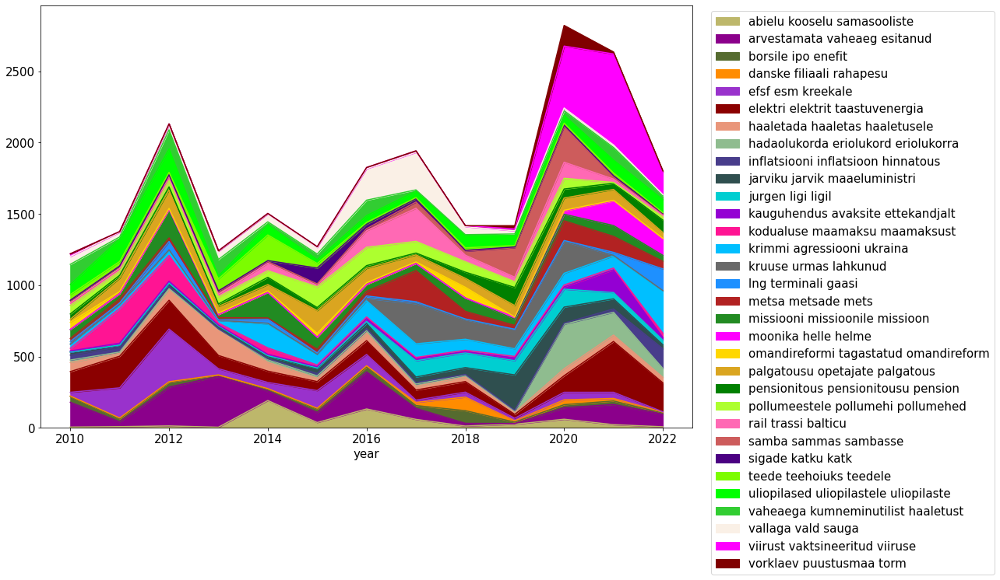

In [85]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories)], use_percentage=False,
                         legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

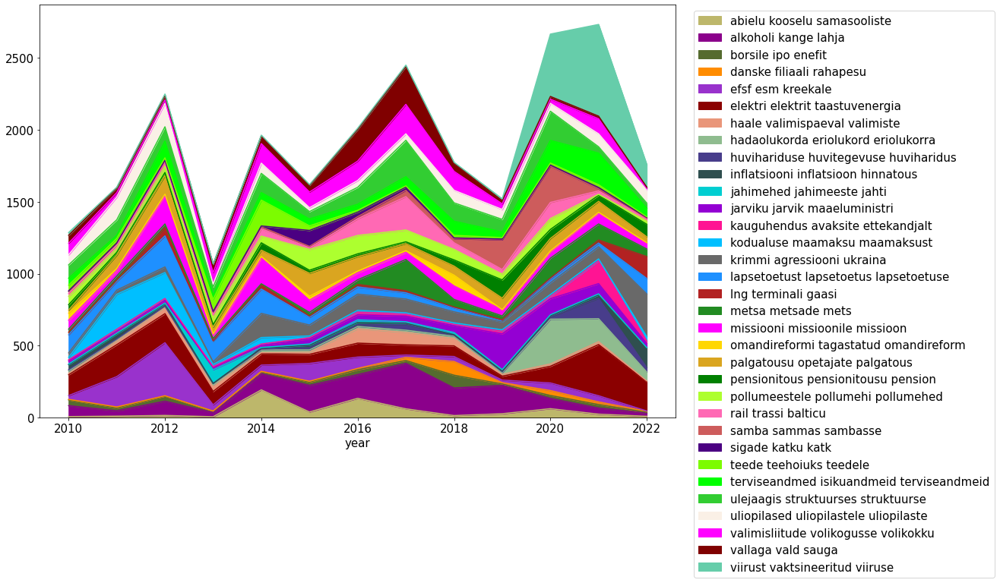

In [86]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories_inform)], use_percentage=False,
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

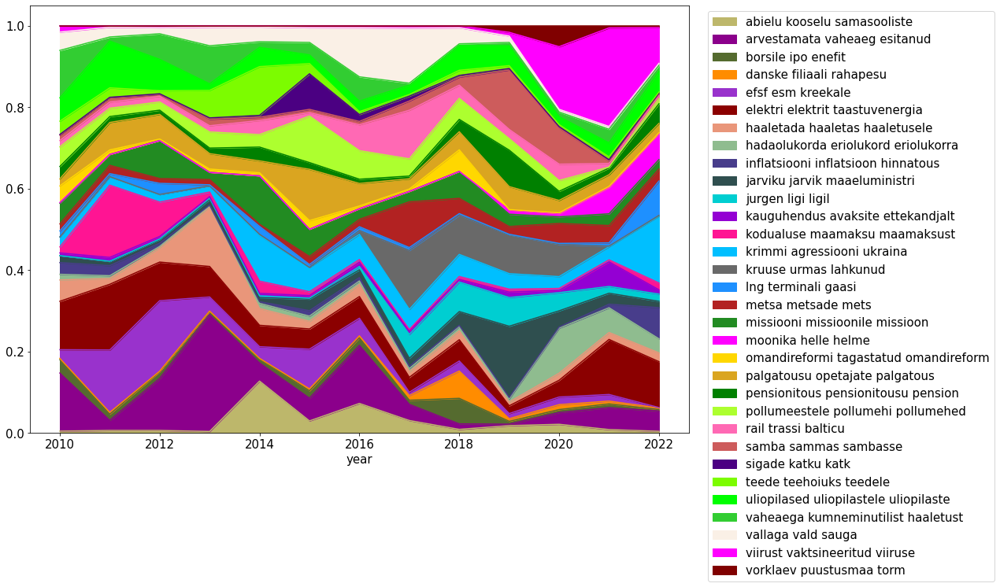

In [87]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories)],
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

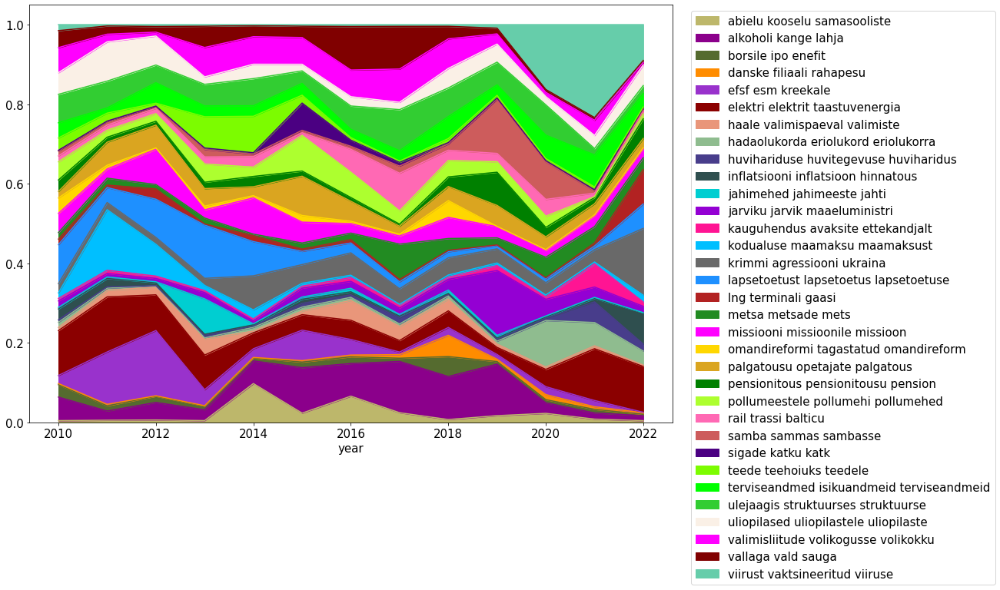

In [88]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories_inform)],
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

## Heatmap of topic, cluster popularity

<AxesSubplot:xlabel='topic_cluster', ylabel='year'>

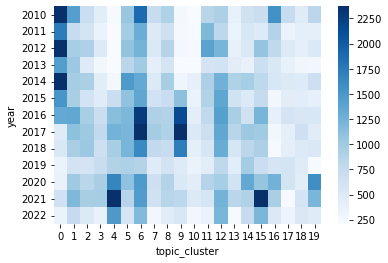

In [40]:
#topic clusters
sns.heatmap(df.groupby(['year'])['topic_cluster'].value_counts().unstack(), robust=True, cmap='Blues')

<AxesSubplot:xlabel='topic_cluster', ylabel='year'>

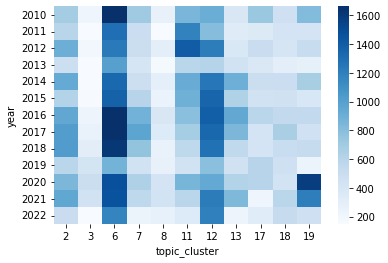

In [41]:
sns.heatmap(df_inform.groupby(['year'])['topic_cluster'].value_counts().unstack(), robust=True, cmap='Blues')

<AxesSubplot:xlabel='topic_id', ylabel='year'>

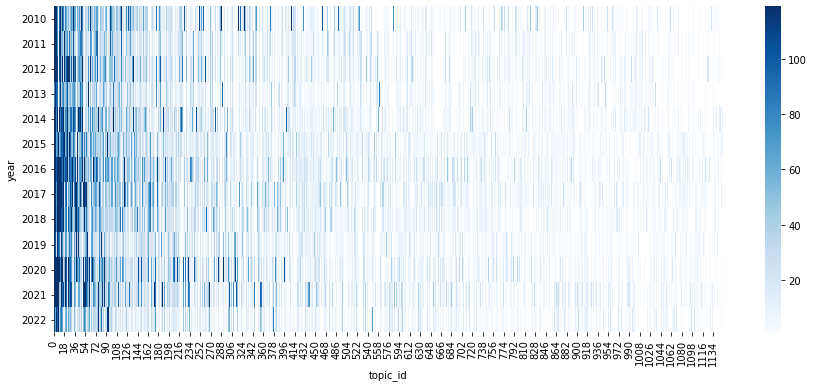

In [42]:
fig, ax =plt.subplots(figsize=(15,6))
sns.heatmap(df.groupby(['year'])['topic_id'].value_counts().unstack(), robust=True, cmap='Blues', ax =ax)

<AxesSubplot:xlabel='topic_id', ylabel='year'>

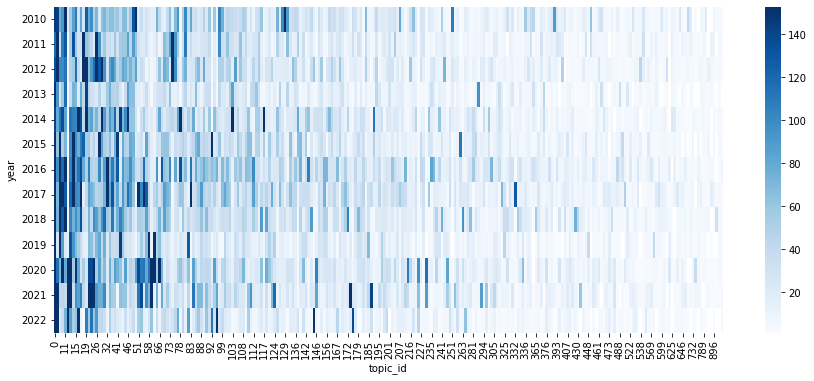

In [43]:
fig, ax =plt.subplots(figsize=(15,6))
sns.heatmap(df_inform.groupby(['year'])['topic_id'].value_counts().unstack(), robust=True, cmap='Blues', ax =ax)

## Compare years topic vectors

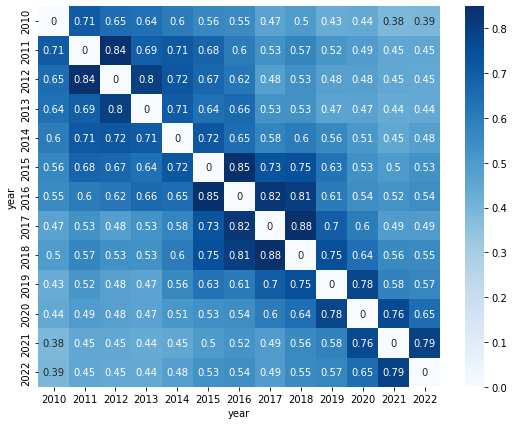

In [44]:
N_TOPICS=df.topic_words3.nunique()
df_year_topic_vecs, df_year_topic_cossim=create_plot_group_topvecs(df, N_TOPICS, 
                                                                   'year', 
                                                                   fillna=0, figsize=(9, 7))

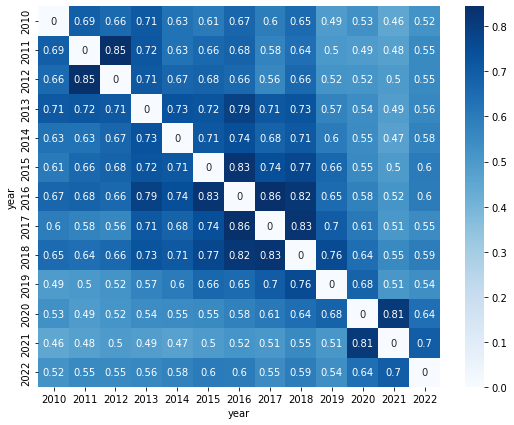

In [45]:
N_TOPICS=df_inform.topic_words3.nunique()
df_year_topic_vecs_inform, df_year_topic_cossim_inform=create_plot_group_topvecs(df_inform, N_TOPICS, 
                                                                   'year', 
                                                                   fillna=0, figsize=(9, 7))

<AxesSubplot:ylabel='year'>

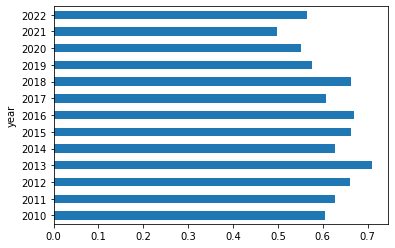

In [46]:
df_year_topic_cossim_inform.median(axis=1).plot(kind='barh')